# Matrix completion

We herebelow present several algorithms for image denoising and text inpainting tasks.

In [1]:
''' clear all variables '''
%reset

Once deleted, variables cannot be recovered. Proceed (y/[n])? y


In [2]:
''' Import packages '''
import numpy as np
import math
from scipy import misc
import matplotlib.pyplot as plt
import time
from __future__ import print_function

from numpy.random import random_integers, randint, sample
import random as rnd

%matplotlib inline

## Getting the noisy image

### Test : about how to generate the noisy image

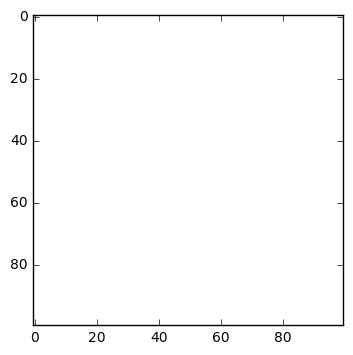

In [40]:
img = np.zeros((100,100),dtype=np.uint8)
img_size = img.shape[0]*img.shape[1]
img[:] = 255

plt.gray() # We show images in a gray-scale format
plt.imshow(img, vmin = 0, vmax = 255)
plt.show()

In [41]:
print("Number of pixels in the image: %s" %(img_size))
PropObserved = 0.3
NrandomPoints = int(np.round((1-PropObserved)*img_size, 0))
print("Number of observed points in the noisy image: %.1f%% " %(100*PropObserved))

Number of pixels in the image: 10000
Number of observed points in the noisy image: 30.0% 


#### Method 1 (with replacement)

In [42]:
Xs = randint(0, img.shape[0], NrandomPoints)
Ys = randint(0, img.shape[1], NrandomPoints)
# tmp = random_noise(ascent, amount=0.0001)
# plt.imshow(tmp)
# plt.show()

Noisy_img = img.copy()
Noisy_img[Xs, Ys] = 0

NoisedProp = 1-float(np.sum(Noisy_img==0))/img_size
print("Noised pixels : %.2f%%" %(100*NoisedProp))

Noised pixels : 49.79%


#### Method 2 (without replacement)

In [43]:
import random as rnd

idx = np.array([], dtype=np.int8).reshape(0,2)

for i in range(img.shape[1]):
    a = np.column_stack((np.ones(img.shape[0], dtype=np.int8)*i, np.arange(img.shape[0])))
    idx = np.concatenate((idx, a))
    
np.random.shuffle(idx)

Z = idx[rnd.sample(range(img_size), NrandomPoints),:]
[Xs, Ys] = Z.T

Noisy_img2 = img.copy()
Noisy_img2[Xs, Ys] = 0

NoisedProp2 = 1-float(np.sum(Noisy_img2==0))/img_size
print("Noised pixels : %.2f%%" %(100*NoisedProp2))

Noised pixels : 30.00%


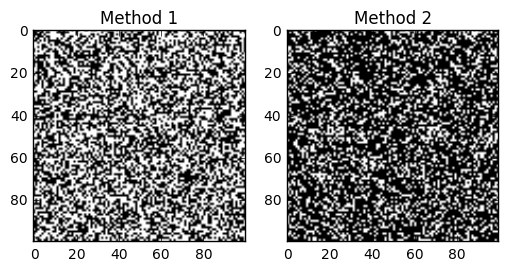

In [44]:
f, (ax1, ax2) = plt.subplots(1, 2)
ax1.imshow(Noisy_img, vmin=0, vmax=255)
ax1.set_title("Method 1")
ax2.imshow(Noisy_img2, vmin=0, vmax=255)
ax2.set_title("Method 2")

The second method is exact while the first one is not, as proceeding with replacement of the omitted pixels.

In [46]:
import random as rnd

def noise(X, PropObserved):
    ''' Returns a noisy version of X given a proportion of observed data '''
    
    if len(X.shape) == 2: # black-and-white image
        n, m = X.shape
    else: # colored RGB image
        n, m, p = X.shape
        
    X_size = n*m
    NrandomPoints = int(np.round((1-PropObserved)*X_size, 0))
    
    Xs = np.zeros(NrandomPoints)
    Ys = np.zeros(NrandomPoints)
    
    idx = np.array([], dtype=np.int8).reshape(0,2)
    for i in range(n):
        a = np.column_stack((np.ones(m, dtype=np.int8)*i, np.arange(m)))
        idx = np.concatenate((idx, a))

    np.random.shuffle(idx)

    Z = idx[rnd.sample(range(X_size), NrandomPoints),:]
    [Xs, Ys] = Z.T
    
    NoisyX = X.copy()
    if len(X.shape) == 2:
        NoisyX[Xs, Ys] = 0
    else:
        NoisyX[Xs, Ys, :] = 0
    
    return(NoisyX)

### Toy dataset

#### Image 1 (black and white): "ascent"

Number of pixels in the image: 262144
Number of observed points in the noisy image: 30.0% 


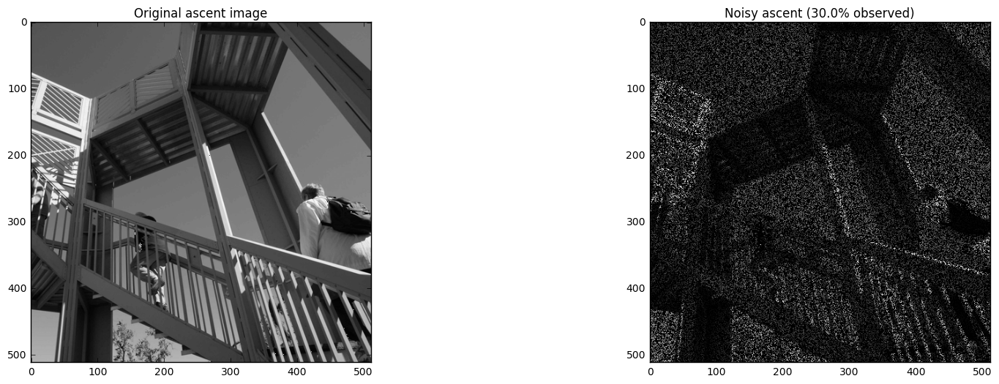

In [63]:
ascent = misc.ascent()

print("Number of pixels in the image: %s" %(ascent.size))
PropObserved = 0.3
NrandomPoints = int(np.round((1-PropObserved)*ascent.size, 0))
print("Number of observed points in the noisy image: %.1f%% " %(100*PropObserved))

Noisyascent = noise(ascent, PropObserved)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,6))
ax1.imshow(ascent, vmin=0, vmax=255)
ax1.set_title("Original ascent image")
ax2.imshow(Noisyascent, vmin=0, vmax=255)
ax2.set_title("Noisy ascent (%.1f%% observed)" %(100*PropObserved))
plt.show()

#### Image 2  (colored): "racoon"

Number of pixels in the image: 2359296
Number of observed points in the noisy image: 30.0% 


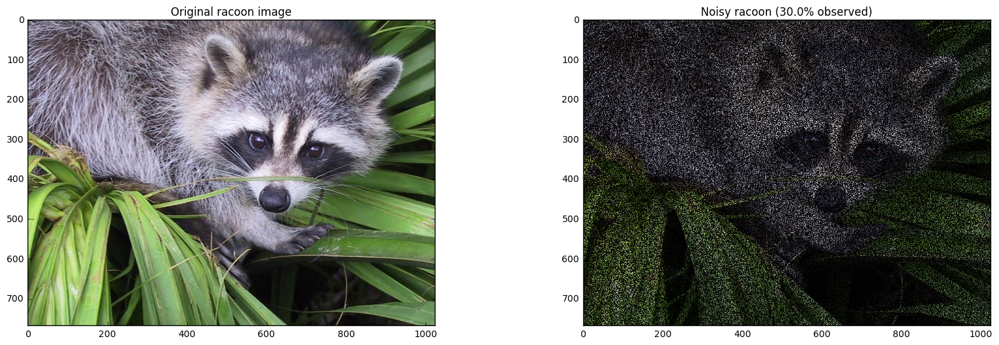

In [64]:
racoon = misc.face()

print("Number of pixels in the image: %s" %(racoon.size))
PropObserved = 0.3
NrandomPoints = int(np.round((1-PropObserved)*ascent.size, 0))
print("Number of observed points in the noisy image: %.1f%% " %(100*PropObserved))

Noisyracoon = noise(racoon, PropObserved)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,6))
ax1.imshow(racoon, vmin=0, vmax=255)
ax1.set_title("Original racoon image")
ax2.imshow(Noisyracoon, vmin=0, vmax=255)
ax2.set_title("Noisy racoon (%.1f%% observed)" %(100*PropObserved))
plt.show()

## Svd

In [65]:
from numpy.linalg import svd

In [111]:
def omega(X):
    """
    Defines the "observable space" of X - here entries with non-null values i.e. not RGB black [0,0,0]
    """
    if len(X.shape)==2:
        ' black-and-white image '
        Y = X.copy()
    else:
        ' colored RGB image '
        Y = X.copy()[:,:,0]
    return Y == 0

def project(X, Omega):
    """
    Projects X on the observable space Omega
    """
    Y = X.copy()
    Y[Omega] = 0
    return Y

def project_orth(X, Omega):
    """
    Projects X on the unobservable space !(Omega)
    """
    Y = X.copy()
    Y[np.logical_not(Omega)] = 0
    return Y

In [110]:
def loss(X, Y, Omega):
    """
    Loss function
    X is the original image
    Y is the predicted image
    Omega is the observable space
    """
    return 1/2*np.linalg.norm(project(X - Y, Omega))**2

def pen_loss(X, Y, Omega, lbda):
    """
    Penalized Loss function to be minimized
    X is the original image
    Y is the predicted image
    Omega is the observable space
    """
    loss = 1./2*np.linalg.norm(project(X - Y, Omega))**2 + lbda*np.linalg.norm(Y, 'nuc')
    return loss

In [103]:
def myMax(X, a):
    """
    Takes the max between 0 and X_i,j - a within X
    """
    X-=a
    X[X < 0] = 0
    return X

### Singular value decomposition (SVD)

Visualization of the singular values (obtained by SVD) of images "ascent" and "racoon".

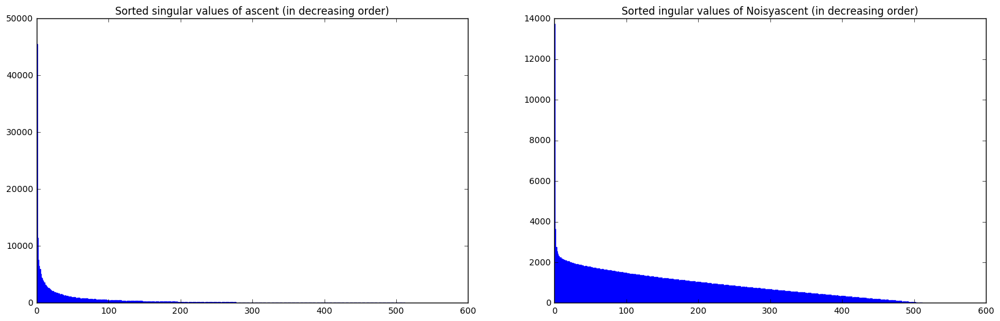

In [73]:
u1, s1, v1 = svd(ascent)
u2, s2, v2 = svd(Noisyascent)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,6))
ax1.bar(np.arange(0,512,1), s1, color="blue", edgecolor="blue")
ax1.set_title("Sorted singular values of ascent (in decreasing order)")
ax2.bar(np.arange(0,512,1), s2, color="blue", edgecolor="blue")
ax2.set_title("Sorted ingular values of Noisyascent (in decreasing order)")
plt.show()

### Soft-threshold operator

In [94]:
def soft_threshold_svd(X, lbda):
    """
    Computes the soft-threshold operator solution of :
    arg min_{Z} ||Z - X||_{2}^{2} + lbda*||Z||_{1}
    """
    n, m = X.shape
    r = min(n, m)
    u_tmp, s_tmp, v_tmp = svd(X, full_matrices=True)
    s = np.zeros((n,m), dtype=float)
    s[:r, :r] = np.diag(s_tmp)
    Z = np.dot(u_tmp, myMax(s, lbda)).dot(v_tmp)
    return Z

# Algorithms

We herebelow present several different algorithms:
- soft-Impute
- Hard-Impute
- MMMF
- softImpute-ALS
- NMF

## soft-Impute

From:
- Mazumder, R., Hastie, T., & Tibshirani, R. (2010). Spectral regularization algorithms for learning large incomplete matrices. Journal of machine learning research, 11(Aug), 2287-2322.

We also got inspired by Hastie's regularization path from:
https://web.stanford.edu/~hastie/swData/softImpute/vignette.html

In [238]:
def soft_impute(X, true_X, Omega, Total_runs=5, Max_iterate=20, epsilon = 0.01, verbose=True, plot_loss=True, plot_pred=True):

    #X = 255*np.ones_like(X) - X
    #true_X = 255*np.ones_like(true_X) - true_X
    
    if len(X.shape)==2:
        BW = True
        ' black-and-white image '
        n, m = X.shape
        u, s, v = svd(X, full_matrices=True)
        ''' regularization path '''
        lbda0 = s[0]
        lbda_seq = np.exp(np.linspace(start=np.log(lbda0), stop=np.log(1.) , num=Total_runs))
        ''' Initialization '''
        X_pred = np.zeros((n, m))
        Z_old = np.zeros((n, m))
        Z_new = np.zeros((n, m))
    else:
        BW = False
        'colored RGB image '
        n, m, p = X.shape
        lbda_seq = []
        for j in range(p):
            u, s, v = svd(X[:,:,j], full_matrices=True)
            ''' regularization path '''
            lbda0 = s[0]
            lbda_seq.append(np.exp(np.linspace(start=np.log(lbda0), stop=np.log(1.) , num=Total_runs)))
        ''' Initialization '''
        X_pred = np.zeros((n, m, p))
        Z_old = np.zeros((n, m, p))
        Z_new = np.zeros((n, m, p))
    
    start_time = time.time()

    improv_list = []
    distance_list = []
    recovery_list = []

    if verbose:
        print("i", "iterate", "distance", "improvement", sep='\t')
        
    for i in range(Total_runs): 

        iterate = 0
        ' We reset the improvement '
        improvement = 1000
        
        while np.logical_and(iterate < Max_iterate, improvement > epsilon):
        
            if BW:
                Z_new = soft_threshold_svd(X + project_orth(Z_old, Omega), lbda_seq[i])
            else:
                for j in range(p):
                    Z_new[:,:,j] = soft_threshold_svd(X[:,:,j] + project_orth(Z_old[:,:,j], Omega), lbda_seq[j][i])
            
            ' metrics '
            ' distance to the true image '
            if BW:
                distance = np.linalg.norm(true_X - Z_old)
                recovery = np.linalg.norm(project(true_X - Z_old, Omega))
                if np.logical_or(i>2, iterate>0):
                    if np.linalg.norm(Z_old) == 0:
                        improvement = 1000
                    else:
                        improvement = (np.linalg.norm(Z_new - Z_old)/np.linalg.norm(Z_old))**2
            else:
                distance = np.sum([np.linalg.norm(true_X[:,:,j] - Z_old[:,:,j]) for j in range(p)])
                recovery = np.sum([np.linalg.norm(project(true_X[:,:,j] - Z_old[:,:,j], Omega)) for j in range(p)])
                if np.logical_or(i>0, iterate>0):
                    if np.sum([np.linalg.norm(Z_old[:,:,j]) for j in range(p)]) == 0:
                        improvement = 0
                    else:
                        improvement = (np.sum([np.linalg.norm(Z_new[:,:,j] - Z_old[:,:,j]) for j in range(p)])/np.sum([np.linalg.norm(Z_old[:,:,j]) for j in range(p)]))**2
                                                         

            improv_list.append(improvement)
            distance_list.append(distance)
            recovery_list.append(recovery)
            ' update '
            Z_old = Z_new.copy()
            iterate+=1
        
        if np.logical_and(verbose, i%10==0):
            print(i, iterate, round(distance,2), round(improvement,6), sep='\t')
         
    X_pred = Z_new.astype(np.uint8)
    
    end_time = time.time()
    time_delta = end_time - start_time
    
    print("Running time: %.2f seconds" %time_delta)
    
    if plot_loss:
        f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 4))
        ax1.set_title("improvement of the penalized loss")
        ax1.semilogy(improv_list, color="orange", linewidth=2)
        ax2.set_title("evolution of the distance to the true image")
        ax2.semilogy(distance_list, color="orange", linewidth=2)
        ax3.set_title("evolution of the recovery of the true image")
        ax3.plot(recovery_list, color="orange", linewidth=2)
        f.show()
    
    if plot_pred:
        ' combination of the input noisy image and optimal completed part '
        if BW:
            BestPred = X + project_orth(X_pred, Omega)
            Noisy_dist = np.linalg.norm(X - true_X)
            Pred_dist = np.linalg.norm(true_X - X_pred)
            BestPred_dist = np.linalg.norm(true_X - BestPred)
        else:
            BestPred = np.zeros((n, m, p))
            for j in range(p):
                BestPred[:,:,j] = X[:,:,j] + project_orth(X_pred[:,:,j], Omega)
            BestPred = BestPred.astype(np.uint8)
            Noisy_dist = np.sum([np.linalg.norm(X[:,:,j] - true_X[:,:,j]) for j in range(p)])
            Pred_dist = np.sum([np.linalg.norm(true_X[:,:,j] - X_pred[:,:,j])  for j in range(p)])
            BestPred_dist = np.sum([np.linalg.norm(true_X[:,:,j] - BestPred[:,:,j]) for j in range(p)])

        
        f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(20, 60))

        ax1.imshow(true_X, interpolation="none", vmin=0, vmax=255)
        ax1.set_title("Original image")

        ax2.imshow(X, interpolation="none", vmin=0, vmax=255)
        ax2.set_title("Noisy image (%.1f%% observed) - distance = %.f" %(100*PropObserved, Noisy_dist))

        ax3.imshow(X_pred, interpolation="none", vmin=0, vmax=255)
        ax3.set_title("Prediction - distance = %.2f" %Pred_dist)

        ax4.imshow(BestPred, interpolation="none", vmin=0, vmax=255)
        ax4.set_title("Best prediction - distance = %.2f" %BestPred_dist)

        f.subplots_adjust(hspace=0)
        f.show()
        
    return(X_pred)

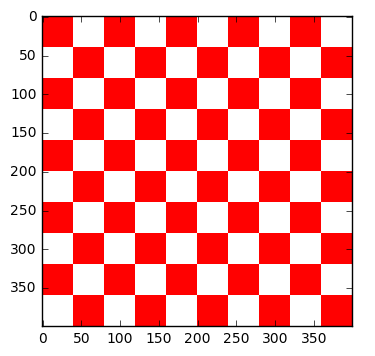

In [239]:
def checkboard(color = True, n=200, num_blockperline=4):
    
    if color:
        M = np.zeros((n,n,3), dtype=np.uint8)
        l = 2*n/num_blockperline

        for i in range(n):
            for j in range(n):
                if np.logical_or(np.logical_and(i%l<l/2, j%l<l/2), np.logical_and(i%l>=l/2, j%l>=l/2)):
                    M[i,j, :] = [255, 1, 1]
                else:
                    M[i,j, :] = [255, 255, 255]
    else:
        M = np.zeros((n,n), dtype=np.uint8)
        l = 2*n/num_blockperline

        for i in range(n):
            for j in range(n):
                if np.logical_or(np.logical_and(i%l<l/2, j%l<l/2), np.logical_and(i%l>=l/2, j%l>=l/2)):
                    M[i,j] = 100
                else:
                    M[i,j] = 255
    return M
    
M = checkboard(True, 400, 10)  
plt.imshow(M, vmin=0, vmax=255, interpolation="none")
plt.show()

i	iterate	distance	improvement
0	2	246250.89	0.0
10	11	38635.93	1e-06
20	4	6712.48	1e-06
30	1	1953.67	1e-06
40	1	568.18	0.0
Running time: 85.10 seconds


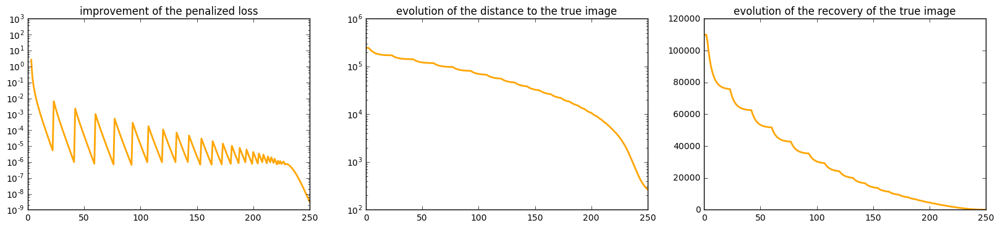

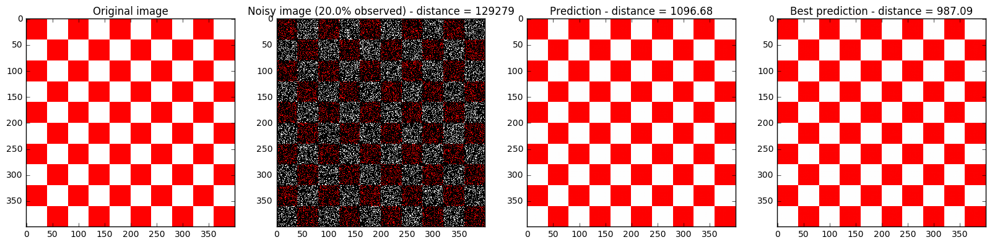

In [240]:
PropObserved = 0.2
NoisyM = noise(M, PropObserved)
OmegaM = omega(NoisyM)
pred = soft_impute(NoisyM, M, OmegaM, Total_runs=50, epsilon=1e-6, verbose=True, plot_loss=True, plot_pred=True)

i	iterate	distance	improvement
0	20	51281.03	1000.0
10	10	22340.54	1e-06
20	7	11595.77	1e-06
30	2	10480.13	1e-06
40	1	10476.46	0.0
Running time: 70.35 seconds


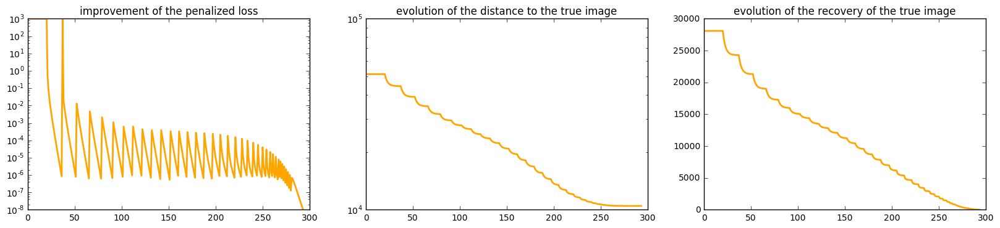

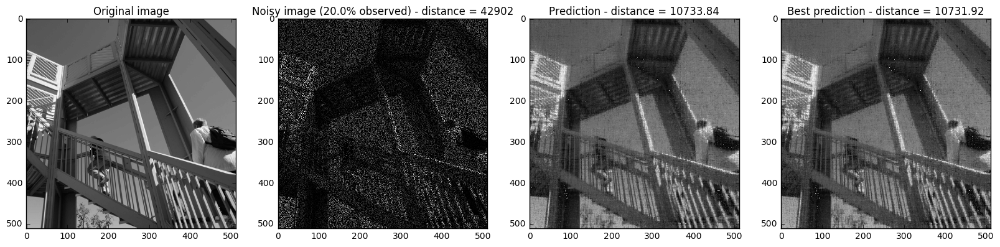

In [154]:
PropObserved = 0.3
pred = soft_impute(Noisyascent, ascent, omega(Noisyascent), Total_runs=50, epsilon=1e-6, verbose=True, plot_loss=True, plot_pred=True)

i	iterate	distance	improvement
0	3	330342.12	0.0
10	7	48768.84	1e-06
Running time: 420.96 seconds


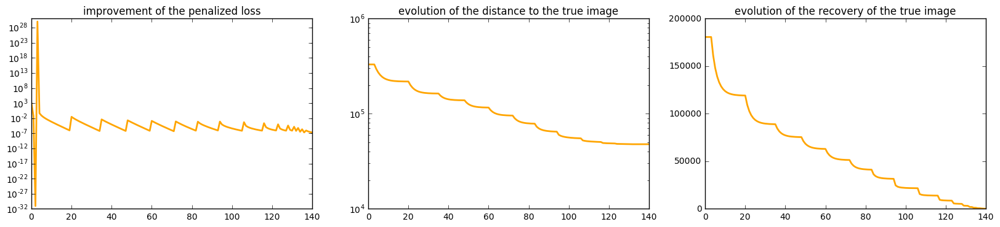

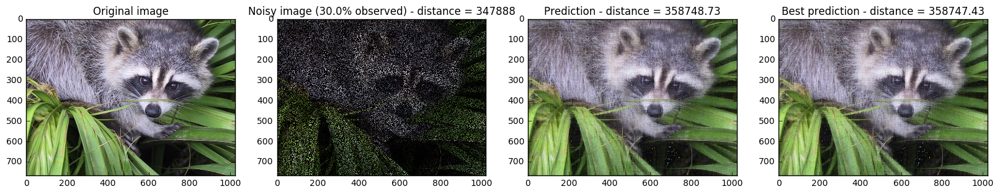

In [162]:
PropObserved = 0.3
pred = soft_impute(Noisyracoon, racoon, omega(Noisyracoon), Total_runs=20, epsilon=1e-6, verbose=True, plot_loss=True, plot_pred=True)

## Hard Impute

The idea of Hard-Impute is to use the $l0$-norm instead of the $l1$-norm in the relaxation of the rank, as proposed in:
- Mazumder, R., Hastie, T., & Tibshirani, R. (2010). Spectral regularization algorithms for learning large incomplete matrices. Journal of machine learning research, 11(Aug), 2287-2322.

The resulting algorithm no longer uses soft but hard-thresholding, which performs a rank-truncated SVD instead of a full SVD, where the rank is chosen.

In [163]:
def H(X, r):
    """
    This function performs the rank r truncated SVD approximation of X.
    """
    u, s, v = svd(X)
    u = u[:,:r]
    v = v[:r,:]
    s = s[:r]
    return u, s, v

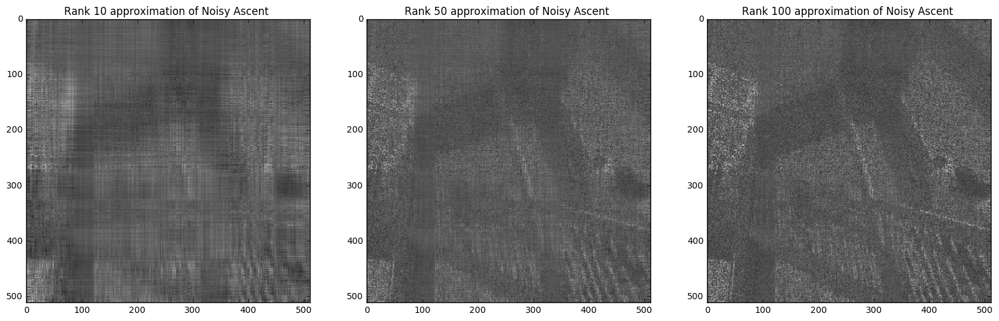

In [164]:
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 60))

u, s, v = H(Noisyascent, 10)

ax1.imshow(np.dot(u, np.diag(s)).dot(v))
ax1.set_title("Rank 10 approximation of Noisy Ascent ")

u, s, v = H(Noisyascent, 50)

ax2.imshow(np.dot(u, np.diag(s)).dot(v))
ax2.set_title("Rank 50 approximation of Noisy Ascent ")

u, s, v = H(Noisyascent, 100)

ax3.imshow(np.dot(u, np.diag(s)).dot(v))
ax3.set_title("Rank 100 approximation of Noisy Ascent ")

plt.show()

In [28]:
def hard_impute(Total_runs=5, Max_iterate=20, epsilon=0.01, X=Noisyascent, rank=20, verbose=True, graph=True):
    
    start_time = time.time()
    
    u, s, v = svd(X)

    improv_list = []
    distance_list = []

    stackpred = np.zeros((ascent.shape[0], ascent.shape[1], Total_runs))
    Z_old = np.zeros((X.shape[0], X.shape[1]))

    if verbose:
        print("i", "iterate", "distance", "improvement", sep='\t')
    
    for i in range(s.shape[0])[0:Total_runs]: 
        
        distance = np.linalg.norm(ascent - Z_old)
        iterate = 0
        improvement = 1000

        while np.logical_and(iterate < Max_iterate, improvement > epsilon): 
            # Here we consider the truncated SVD approximation of the input Matrix
            tmp = H(Noisyascent + project_orth(Z_old, X),rank) 
            Z_new = tmp[0].dot(np.diag(tmp[1])).dot(tmp[2])
            ' metrics '
            ' distance to the true image '
            distance = np.linalg.norm(ascent - Z_new)
            ' improvement of Z_new compared to Z_old '
            if np.linalg.norm(Z_old) == 0:
                improvement = 0
            else:
                improvement = (np.linalg.norm(Z_new - Z_old)/np.linalg.norm(Z_old))**2
            
            improv_list.append(improvement)
            distance_list.append(distance)
            ' update '
            Z_old = Z_new
            iterate+=1

        stackpred[:,:,i] = Z_new
        
        if verbose:
            print(i, iterate, round(distance,2), round(improvement,3), sep='\t')
            
    end_time = time.time()
    time_delta = end_time - start_time
    
    print("Running time: %.2f seconds" %time_delta)
   
    if graph:
        plt.title("improvement of the penalized loss")
        plt.plot(improv_list, color="orange", linewidth=2)
        plt.show()
        plt.title("evolution of the distance to the true image")
        plt.plot(distance_list, color="orange", linewidth=2)
        plt.show()
    
    return(stackpred)

Running time: 20.20 seconds


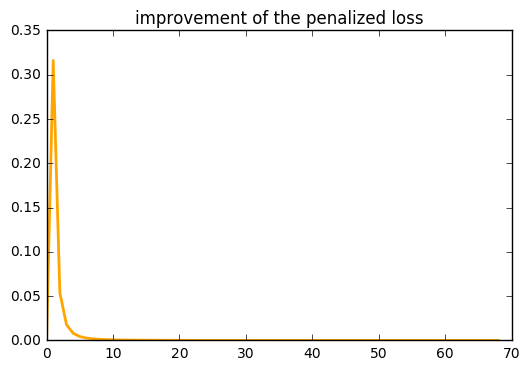

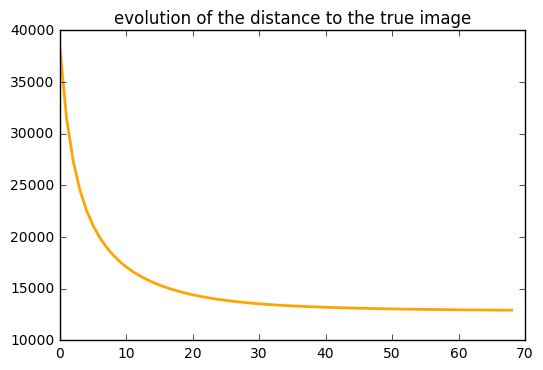

In [29]:
stackpred = hard_impute(Total_runs=20, epsilon=0.00001, verbose=False, graph=True)

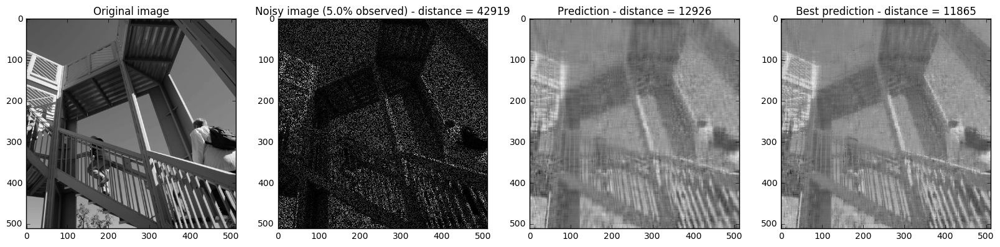

In [31]:
' combination of the input noisy image and optimal completed part '
BestPred = Noisyascent + project_orth(stackpred[:,:,-1], Noisyascent)

f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(20, 60))

ax1.imshow(ascent)
ax1.set_title("Original image")

ax2.imshow(Noisyascent)
ax2.set_title("Noisy image (%.1f%% observed) - distance = %.f" %(100*PropObserved, np.linalg.norm(Noisyascent - ascent)))

ax3.imshow(stackpred[:,:,-1])
ax3.set_title("Prediction - distance = %.f" %(np.linalg.norm(ascent - stackpred[:,:,-1])))

ax4.imshow(BestPred)
ax4.set_title("Best prediction - distance = %.f" %(np.linalg.norm(ascent - BestPred)))

f.subplots_adjust(hspace=0)
f.show()

## MMMF

Maximum-Margin Matrix Factorization (MMMF) representation of the matrix completion problem, solved using alternating least-squares (ALS), from:
- Srebro, N., Rennie, J. D., & Jaakkola, T. S. (2004, December). Maximum-Margin Matrix Factorization. In NIPS (Vol. 17, pp. 1329-1336).

In [34]:
def MMMF(X, true_X, Total_runs=10, lbda=10, rank=20, epsilon = 0.01, verbose=True, graph=True):

    modulo = 100
    
    start_time = time.time()
    
    n, m = X.shape
    
    ' We initialize matrices A and B '
    ' WARM START given by : ? '
    u, s, v = H(X, rank) #u.shape (512L, 20L) #v.shape (20L, 512L)
    D = np.diag(s) 
    
    A = np.dot(u, D)  #(512L, 20L)
    B = np.dot(v.T,D).T #(512L, 20L)
    
    A_new = A
    B_new = B
    
    #A = 255 * np.random.rand(m, n_factors) 
    #B = 255 * np.random.rand(n_factors, n)
    
    u, s, v = svd(X)

    improv_list = []
    distance_list = []

    stackpred = np.zeros((ascent.shape[0], ascent.shape[1]))
    Z_old = A.dot(B)
    
    distance = np.linalg.norm(ascent - Z_old)
    iterate = 0
    improvement = 1000
    
    if verbose:
        print("iterate", "distance", "improvement", sep='\t')

    while np.logical_and(iterate < Total_runs, improvement > epsilon): 
        
        A = np.linalg.solve(np.dot(B, B.T) + lbda * np.eye(rank), np.dot(B, X.T)).T
        B = np.linalg.solve(np.dot(A.T, A) + lbda * np.eye(rank), np.dot(A.T, X))
        
        Z_new = A.dot(B)
        distance = np.linalg.norm(true_X - Z_new)
        ' improvement of Z_new compared to Z_old '
        if np.linalg.norm(Z_old) == 0:
            improvement = 0
        else:
            improvement = (np.linalg.norm(Z_new - Z_old)/np.linalg.norm(Z_old))**2

        improv_list.append(improvement)
        distance_list.append(distance)
        ' update '
        Z_old = Z_new
        
        if np.logical_and(verbose, iterate%modulo==0):
            print(iterate, round(distance,2), round(improvement,6), sep='\t')
            
        iterate+=1
        
    stackpred = Z_new
            
    end_time = time.time()
    time_delta = end_time - start_time
    
    print("Running time: %.2f seconds" %time_delta)
    
    if graph:
        plt.title("improvement of the penalized loss")
        plt.plot(improv_list, color="orange", linewidth=2)
        plt.show()
        plt.title("evolution of the distance to the true image")
        plt.plot(distance_list, color="orange", linewidth=2)
        plt.show()
    
    return(stackpred)

iterate	distance	improvement
0	44960.71	0.999907
100	41906.51	0.0
200	41900.64	0.0
Running time: 15.25 seconds


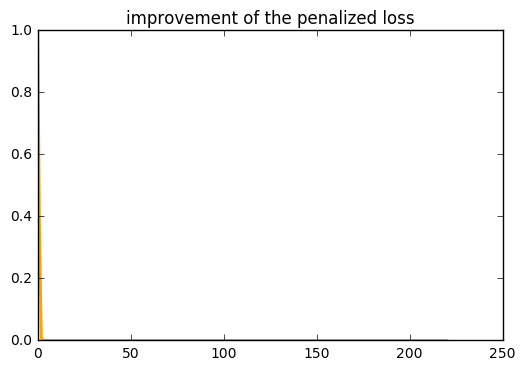

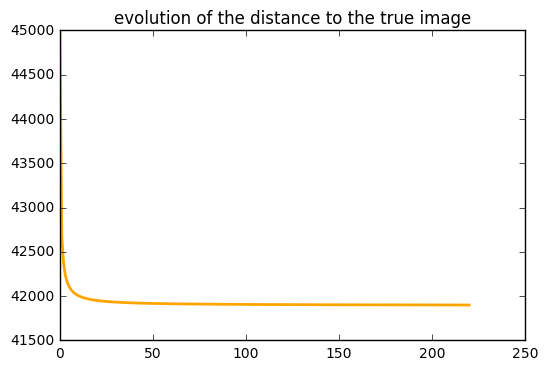

In [35]:
stackpred = MMMF(Noisyascent, ascent, Total_runs=1000, lbda=1, rank=200, epsilon=1e-10)

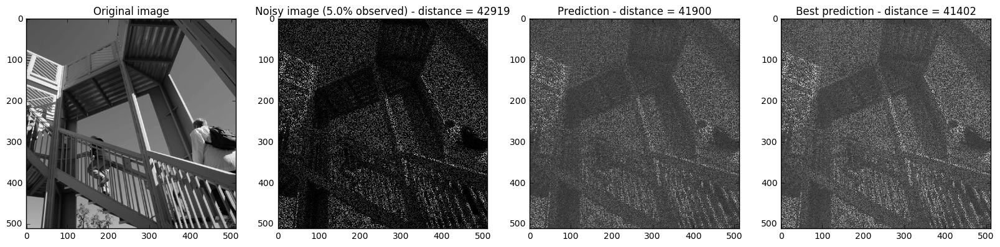

In [36]:
' combination of the input noisy image and optimal completed part '
BestPred = Noisyascent + project_orth(stackpred, Noisyascent)

f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(20, 60))

ax1.imshow(ascent)
ax1.set_title("Original image")

ax2.imshow(Noisyascent)
ax2.set_title("Noisy image (%.1f%% observed) - distance = %.f" %(100*PropObserved, np.linalg.norm(Noisyascent - ascent)))

ax3.imshow(stackpred)
ax3.set_title("Prediction - distance = %.f" %(np.linalg.norm(ascent - stackpred)))

ax4.imshow(BestPred)
ax4.set_title("Best prediction - distance = %.f" %(np.linalg.norm(ascent - BestPred)))

f.subplots_adjust(hspace=0)
f.show()

## soft-Impute ALS

Method combining both soft-Impute and MMMF (in order to replace the soft-threshold operation), from:
- Hastie, T., Mazumder, R., Lee, J. D., & Zadeh, R. (2015). Matrix completion and low-rank svd via fast alternating least squares. J. Mach. Learn. Res, 16(1), 3367-3402.

In [37]:
def softImpute_ALS(X, r, lbda=1., Max_iter=20):
    #warm start
    u, s, v = H(X,r) #u.shape (512L, 20L) #v.shape (20L, 512L)
    D = np.diag(s) 
    
    A = np.dot(u, D)  #(512L, 20L)
    B = np.dot(v.T,D) #(512L, 20L)
    
    A_new = A
    B_new = B
    
    iter = 0

    while iter <= Max_iter:
        A = A_new #inutile pour la premiere iteration
        B = B_new #inutile pour la premiere iteration
        ReducedNoisyAscent = np.dot(u, np.diag(s)).dot(v)
        X_star = project(ReducedNoisyAscent, X) - project_orth(A.dot(B.T), X) + A.dot(B.T)

        B_tild = np.linalg.solve(D**2 + lbda*np.eye(len(s)), D.dot(u.T).dot(X_star)) # attention transposed

        BD = B_tild.T.dot(D) #(512L, 20L)

        u_tild, s2, v_tild = H(BD, r)   #il n'y a pas d'autre solution que H sinon dim pb
        # u_tild.shape (512L, 20L)
        # v_tild.shape (20L, 20L)
        D = np.diag(np.sqrt(s2))
        B_new = u_tild.dot(D)

        A_tild = X_star.dot(u_tild).dot(D).dot(np.linalg.inv(D**2 + lbda*np.eye(len(s)))) #from page 8
        # A_tild.shape (512L, 20L)
        AD = A_tild.dot(D)
        v_tild, s2, vv_tild = H(AD, r) #u_tild.shape (512L, 20L),v_tild.shape (20L, 20L)

        D = np.diag(np.sqrt(s2))
        A_new = np.dot(v_tild, D) #(512L, 20L)  
        iter+=1

    M = X.dot(v_tild)
    U, d, R = svd(M) #U.shape (512L, 512L) R.shape (20L, 20L)

    A = U.dot(X)
    B = R.T.dot(np.diag(d))
#     plt.imshow(A_new.dot(B_new.T))
    #Normalement A_new*B_new' est une bonne prediction
    output = A_new.dot(B_new.T)
    
    return A_new.dot(B_new.T)

In [38]:
pred = softImpute_ALS(Noisyascent, 20, Max_iter=1000)

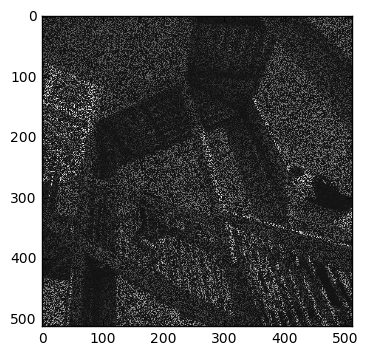

In [41]:
plt.imshow(Noisyascent+project_orth(pred, ascent))
plt.show()

## NMF

Nonnegative matrix factorization (NMF) technique from:
- Berry, M. W., Browne, M., Langville, A. N., Pauca, V. P., & Plemmons, R. J. (2007). Algorithms and applications for approximate nonnegative matrix factorization. Computational statistics & data analysis, 52(1), 155-173.

In [247]:
def NMF(X, true_X, Omega, r, lbda=1., Max_iter=10000, verbose=True, print_time=True, plot_loss=True, plot_pred=True):
    
    start_time = time.time()
    
    improv_list = []
    distance_list = []
    recovery_list = []
    Z_old = np.zeros_like(X)
    W = np.random.randint(low=0,high=255,size=(X.shape[0], r))
    
    if verbose:
        print("iterate", "distance", "improvement", sep='\t')
    
    for i in range(Max_iter):
        
        H = np.linalg.solve(W.T.dot(W), W.T.dot(X))
        H[H<0] = 0
        W = np.linalg.solve(H.dot(H.T), H.dot(X.T)).T
        W[W<0] = 0
#         Noisyascent + project_orth(a, Noisyascent)
        Z_new = W.dot(H)
        recovery = np.linalg.norm(project(true_X - Z_old, Omega))
        recovery_list.append(recovery)
        distance = np.linalg.norm(true_X - Z_new)
        if np.linalg.norm(Z_old)==0:
            improvement = 1000
        else:
            improvement = (np.linalg.norm(Z_new - Z_old)/np.linalg.norm(Z_old))**2
        improv_list.append(improvement)
        distance_list.append(distance)
#         if i%1000==0:
#             print(np.sum(project(Z_new, X)))
        Z_old = Z_new.copy()
    
        if np.logical_and(verbose, i%(Max_iter/10)==0):
            print(i, round(distance,2), round(improvement,6), sep='\t')
    
    X_pred = W.dot(H).astype(np.uint8)
    
    end_time = time.time()
    time_delta = end_time - start_time
    
    if print_time:
        print("Running time: %.2f seconds" %time_delta)
    
    if plot_loss:
        f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 4))
        ax1.set_title("improvement of the penalized loss")
        ax1.semilogy(improv_list, color="orange", linewidth=2)
        ax2.set_title("evolution of the distance to the true image")
        ax2.semilogy(distance_list, color="orange", linewidth=2)
        ax3.set_title("evolution of the recovery of the true image")
        ax3.plot(recovery_list, color="orange", linewidth=2)
        f.show()
    
    if plot_pred:
        ' combination of the input noisy image and optimal completed part '
        BestPred = X + project_orth(X_pred, Omega)
        Noisy_dist = np.linalg.norm(X - true_X)
        Pred_dist = np.linalg.norm(true_X - X_pred)
        BestPred_dist = np.linalg.norm(true_X - BestPred)
        
        f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(20, 60))

        ax1.imshow(true_X, interpolation="none", vmin=0, vmax=255)
        ax1.set_title("Original image")

        ax2.imshow(X, interpolation="none", vmin=0, vmax=255)
        ax2.set_title("Noisy image (%.1f%% observed) - distance = %.f" %(100*PropObserved, Noisy_dist))

        ax3.imshow(X_pred, interpolation="none", vmin=0, vmax=255)
        ax3.set_title("Prediction - distance = %.2f" %Pred_dist)

        ax4.imshow(BestPred, interpolation="none", vmin=0, vmax=255)
        ax4.set_title("Best prediction - distance = %.2f" %BestPred_dist)

        f.subplots_adjust(hspace=0)
        f.show()

    return X_pred

By running the following code, the problem is to select a rank $r$ such that $r \ll \min(n, m)$. There is a trade off between selecting a big $r$ and having low iterations possible before obtaining a singular matrix or selecting a small $r$ and not much improving the quality of the noisy input image.

Since $W$ is set at random, multiples attempt with the same $r$ value may lead to different outcomes.

iterate	distance	improvement
0	35678.91	1000.0
100	35047.42	1.1e-05
200	35086.99	3e-06
300	35099.71	1e-06
400	35100.73	1e-06
500	35118.07	1e-06
600	35118.5	0.0
700	35107.67	0.0
800	35097.66	0.0
900	35093.36	0.0
Running time: 31.69 seconds


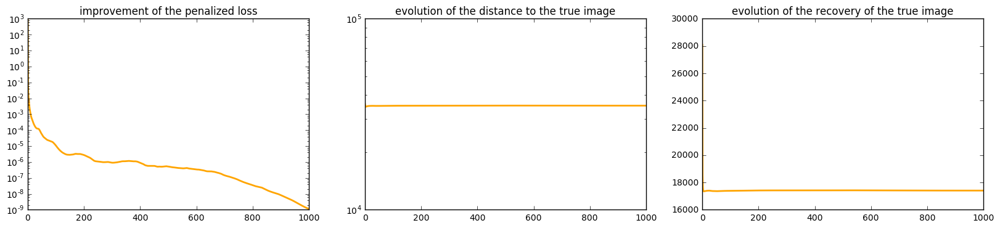

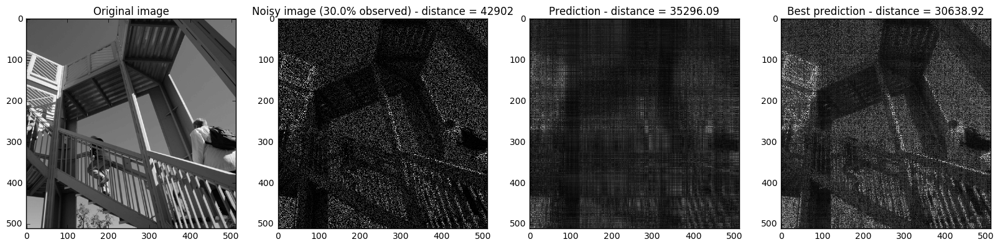

In [204]:
a = NMF(Noisyascent, ascent, omega(Noisyascent), 20, Max_iter=1000)

## Analysis of the influence of the rank on the NMF

We choose to work on the same toy example of a checkboard where the rank is none (equal to 2).
NMF should then use $r=2$ - though it is unknown in practice as we do not observe the "true" image - in order to recover the true image but, as we see below, if the image is too much noised, it is not reliable.

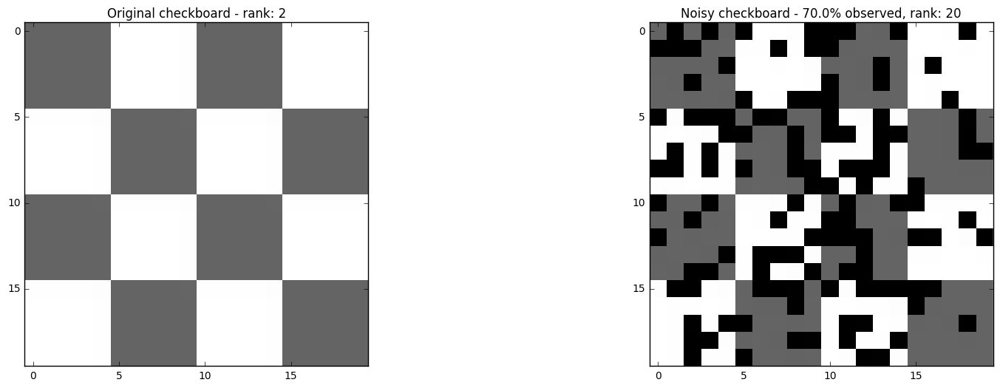

In [269]:
M = checkboard(False, 20, 4)
PropObserved = 0.7
NoisyM = noise(M, PropObserved)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,6))
ax1.imshow(M, interpolation="none", vmin=0, vmax=255)
ax1.set_title("Original checkboard - rank: %d" %np.linalg.matrix_rank(M))
ax2.imshow(NoisyM, interpolation="none", vmin=0, vmax=255)
ax2.set_title("Noisy checkboard - %s%% observed, rank: %d" %(100*float(PropObserved),np.linalg.matrix_rank(NoisyM)))
plt.show()

iterate	distance	improvement
0	1672.4	1000.0
100	1429.03	0.0
200	1429.03	0.0
300	1429.03	0.0
400	1429.03	0.0
500	1429.03	0.0
600	1429.03	0.0
700	1429.03	0.0
800	1429.03	0.0
900	1429.03	0.0
Running time: 0.34 seconds


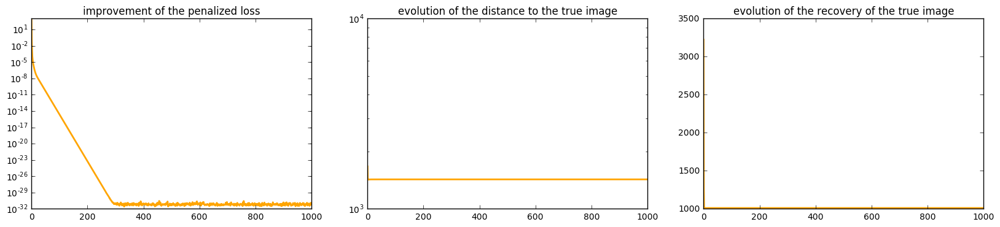

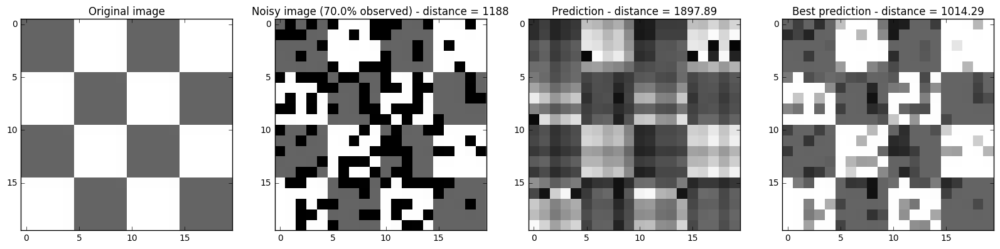

In [275]:
''' Example '''
NMF(NoisyM, M, omega(NoisyM), r=2, Max_iter=1000);

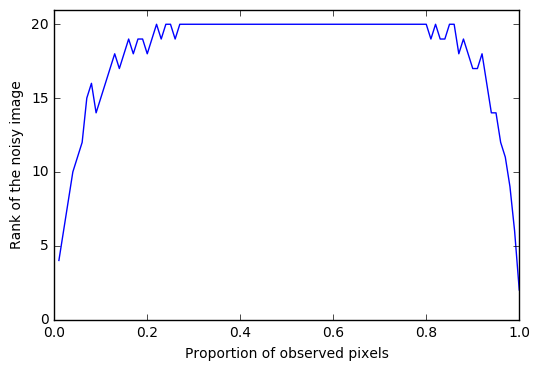

In [264]:
ranks = np.zeros((100, 2))

for r in range(100):
    PropObserved = 1.-float(r)/100
    NoisyM = noise(M, PropObserved)
    ranks[r,:] = [PropObserved, np.linalg.matrix_rank(NoisyM)]
    
plt.figure()
plt.plot(ranks[:,0], ranks[:,1])
plt.ylim((0,21))
plt.xlabel("Proportion of observed pixels")
plt.ylabel("Rank of the noisy image")
plt.show()

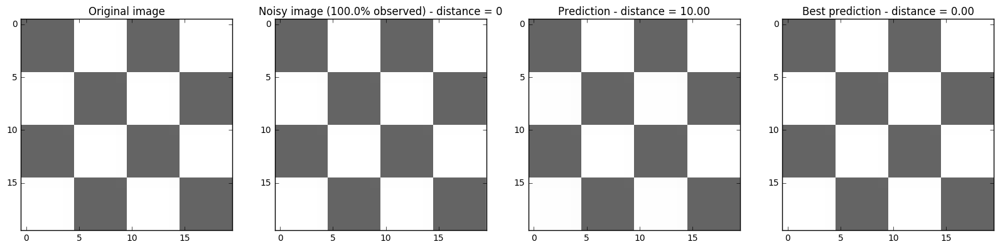

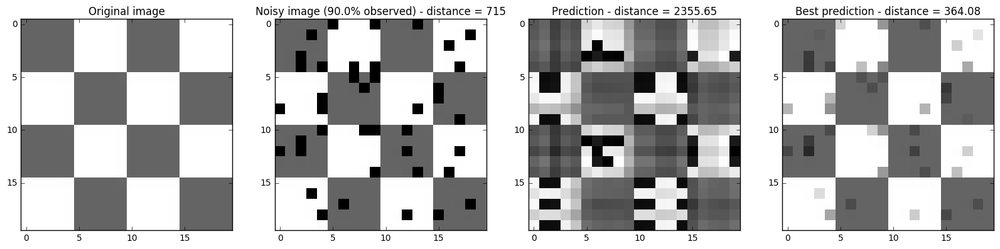

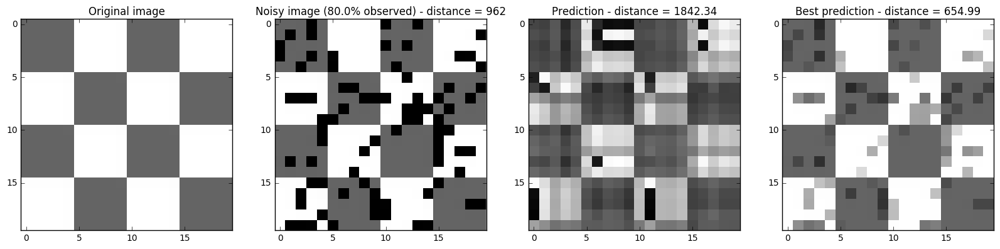

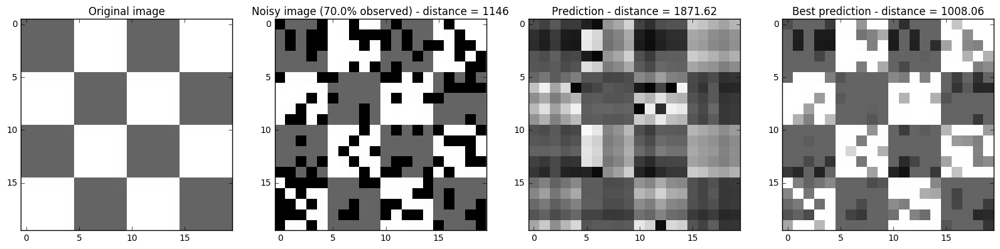

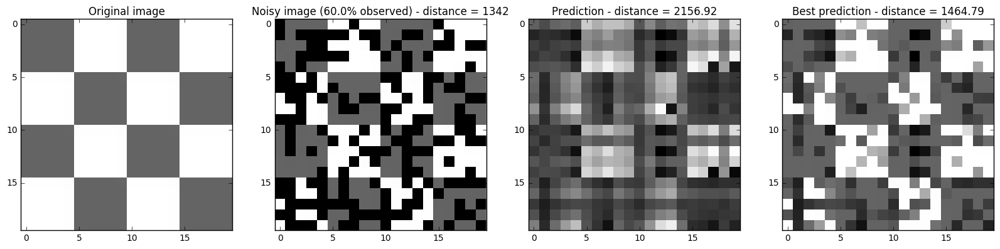

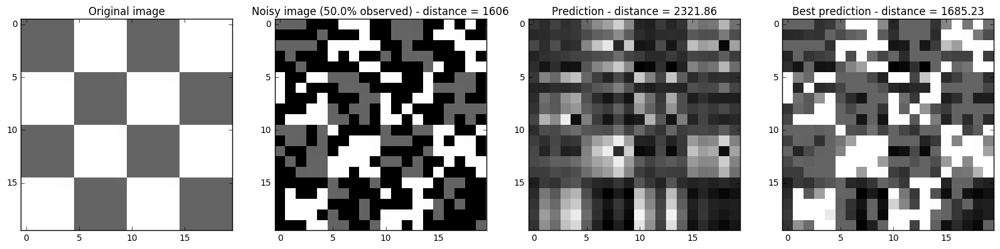

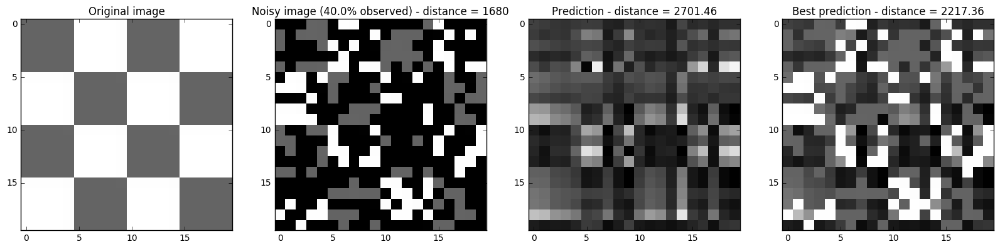

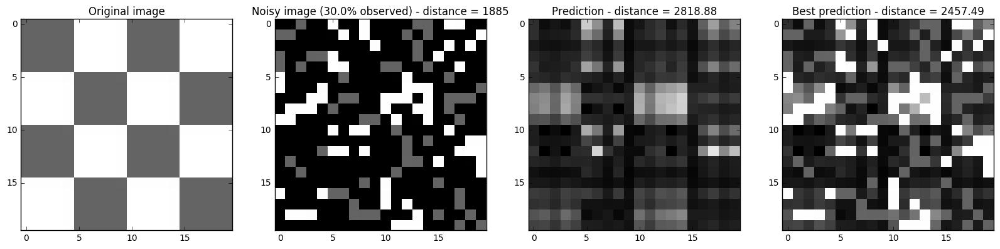

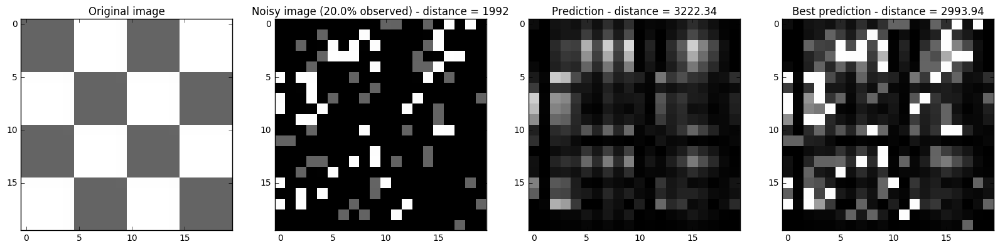

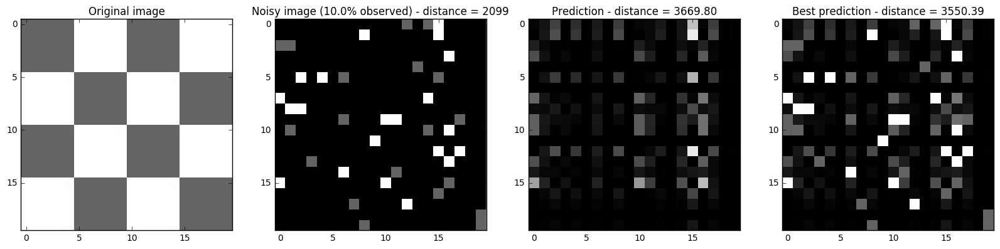

In [265]:
for r in range(100):
    PropObserved = 1.-float(r)/100
    NoisyM = noise(M, PropObserved)
    ranks[r,:] = [PropObserved, np.linalg.matrix_rank(NoisyM)]
    if r%10==0:
        NMF(NoisyM, M, omega(NoisyM), r=2, Max_iter=20, verbose=False, print_time=False, plot_loss=False);

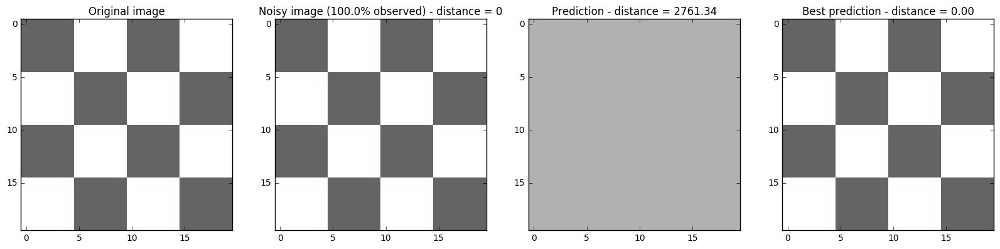

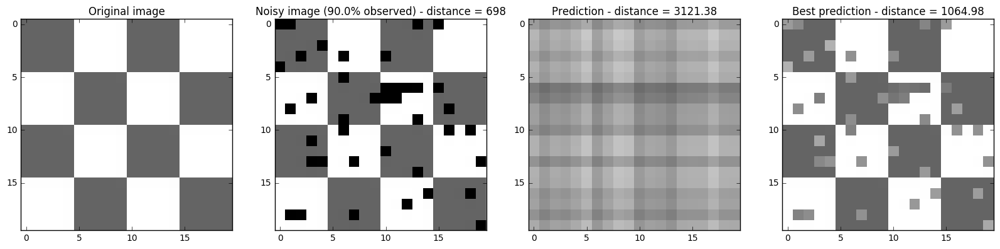

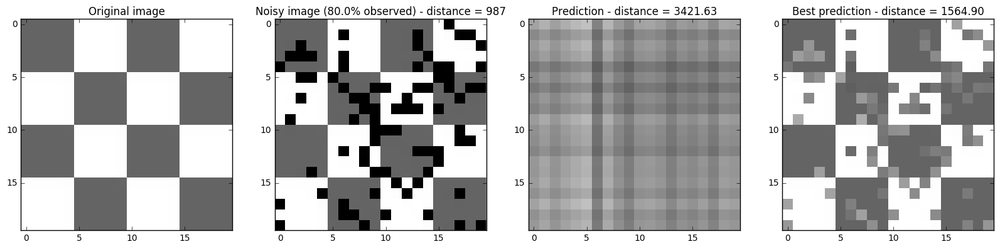

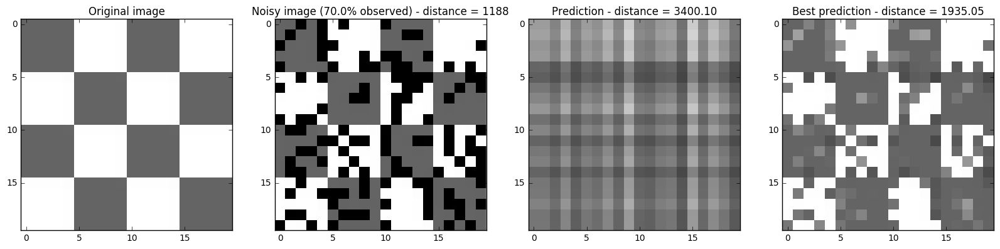

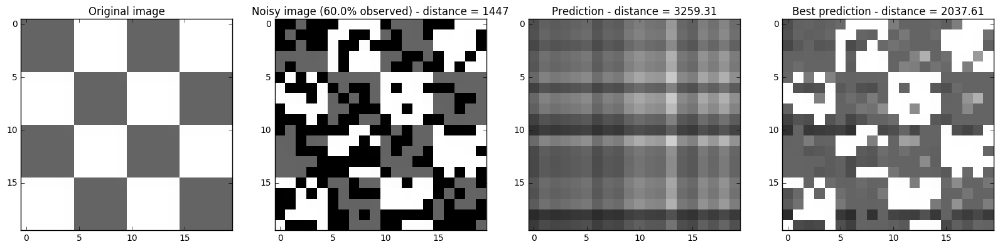

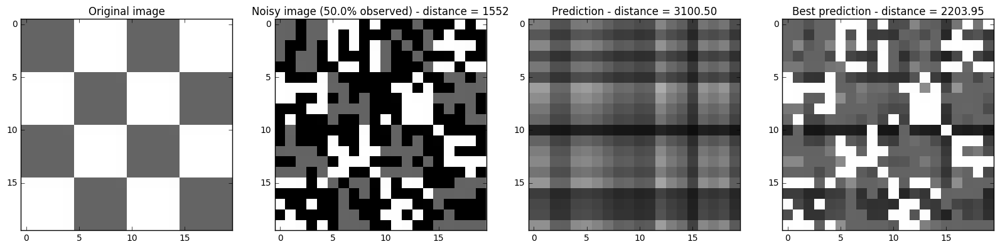

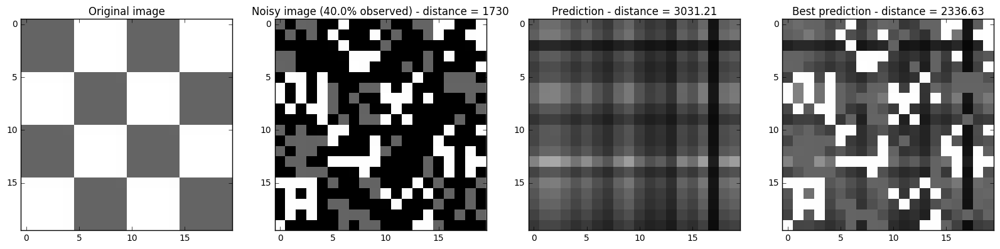

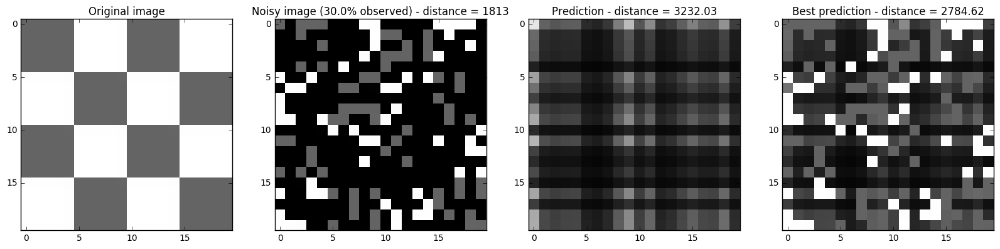

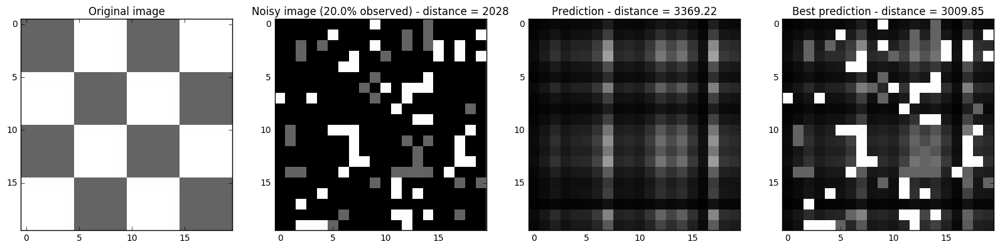

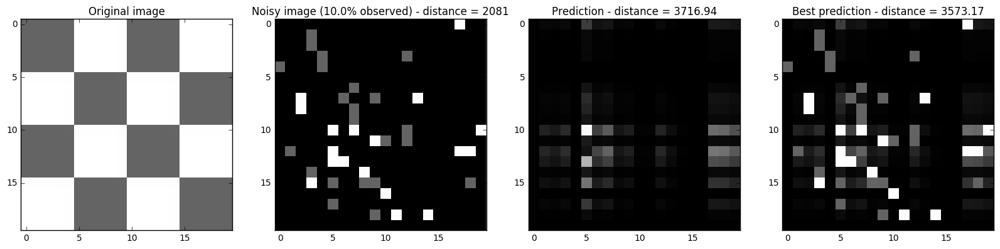

In [266]:
for r in range(100):
    PropObserved = 1.-float(r)/100
    NoisyM = noise(M, PropObserved)
    ranks[r,:] = [PropObserved, np.linalg.matrix_rank(NoisyM)]
    if r%10==0:
        NMF(NoisyM, M, omega(NoisyM), r=1, Max_iter=20, verbose=False, print_time=False, plot_loss=False);

## Application to text inpainting

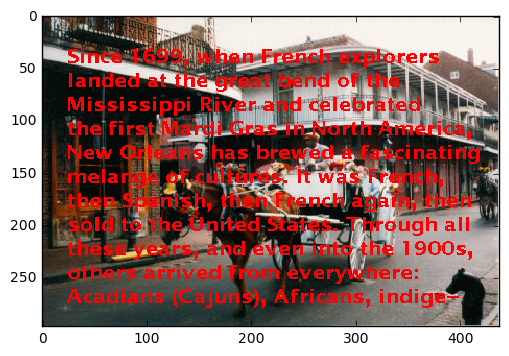

In [285]:
text_img = misc.imread('text_inpainting1.gif')
plt.imshow(text_img, interpolation="none", vmin=0, vmax=255);

In [286]:
def dist(X, Y):
    return (np.linalg.norm(X - Y, axis=2)/255)**2

def project_nottext(X, col, epsilon, check=True):
    ''' project X on the non text region of Z, with a given tolerance epsilon '''
    
    ''' distance to "red" '''
    if col=='red':
        pix = np.asarray([255,0,0])
    elif col=='black':
        pix = np.asarray([0,0,0])
    
    Y = X.copy()
    Y[dist(X, pix) < epsilon] = [0,0,0]
    
    if check:
        Y_check = X.copy()
        Y_check[dist(X, pix) < epsilon] = [0,255,0]
        plt.imshow(Y_check, interpolation=None, vmin=0, vmax=255)
        plt.title("Identified zone in green")
        plt.show()
    return Y

def project_istext(X):
    ''' project X on the unobservable space of Z, namely every (i,j) where Z[i,j]=0 '''
    
    text = project_nottext(X)

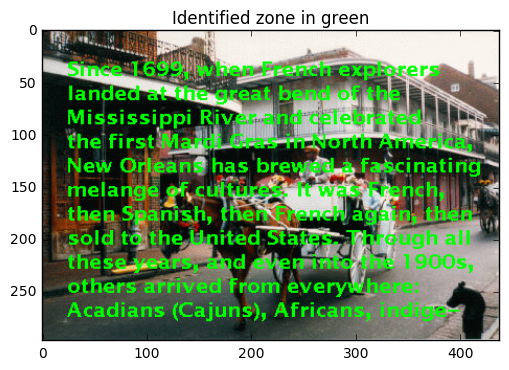

In [287]:
text_img_preprop = project_nottext(text_img, 'red', 0.001)

i	iterate	distance	improvement
0	2	138000.53	0.0
Running time: 26.15 seconds


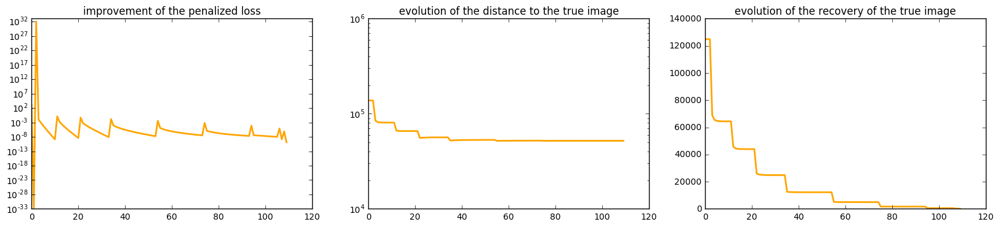

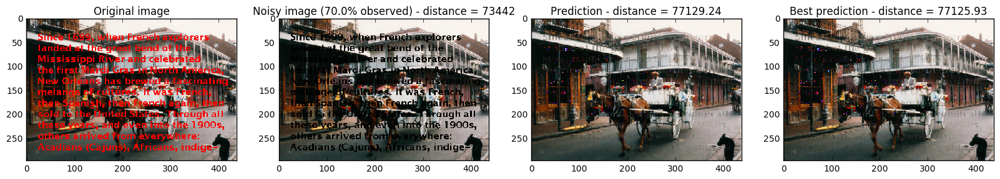

In [288]:
pred = soft_impute(text_img_preprop, text_img, omega(text_img_preprop), Total_runs=10, epsilon=1e-8)

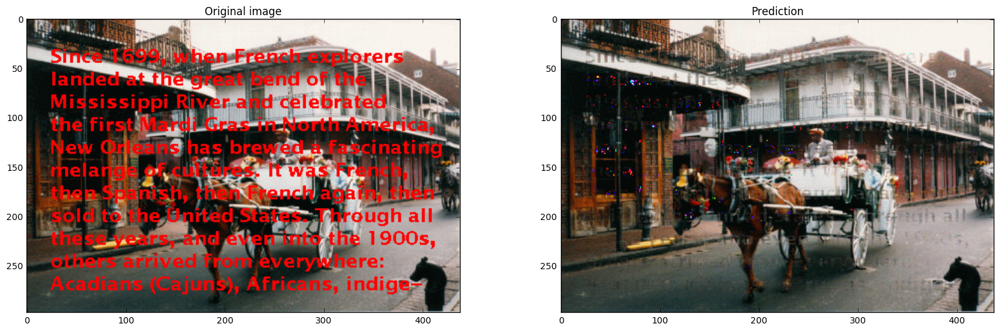

In [294]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,6))
ax1.set_title("Original image")
ax1.imshow(text_img)
ax2.set_title("Prediction")
ax2.imshow(pred)
f.show()